In [ ]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 22.15 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
!pip install Sequential

  Preparing metadata (setup.py) ... done
  Created wheel for Sequential: filename=sequential-1.0.0-py3-none-any.whl size=2857 sha256=95628ef371af6ef73f78f37143b71236ee2de31c88a6671350f1a18d8bed91be
  Stored in directory: /root/.cache/pip/wheels/c3/61/56/fe456787532527aafb108ffeceecb4a2e928a518c88bbdd5c5
Successfully built Sequential


In [ ]:
!pip install pyyaml h5py

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn
from tensorflow import keras
import tensorflow as tf
import pandas as pd
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import random
import cv2
import matplotlib.image as mpimg
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense


In [ ]:
datadir='track'
columns=['Center','left','right','steering','throttle','reverse','speed']
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)
pd.set_option('display.max_colwidth',None)
data.head()

,Center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
data.shape

(4053, 7)

In [ ]:
def path_leaf(path):
  head, tail=ntpath.split(path)
  return tail
data['Center']=data['Center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,Center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


<BarContainer object of 25 artists>

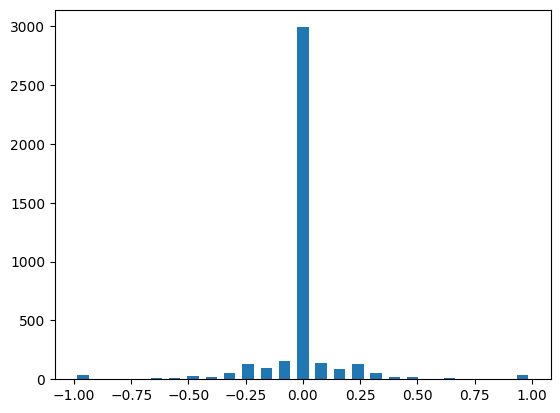

In [ ]:
num_bins=25
threshold=400
hist, bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
# plt.plot((np.min(data['steering']),np.max(data['steering'])),(threshold,threshold))

In [ ]:
data.shape

In [ ]:
remove_lst=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
      list_.append(i)
  list_=shuffle(list_)
  list_=list_[threshold:]
  remove_lst.extend(list_)
print('removed',len(remove_lst),'files')
data.drop(data.index[remove_lst],inplace=True)
print('remaining',len(data))

removed 2590 files
remaining 1463


<BarContainer object of 25 artists>

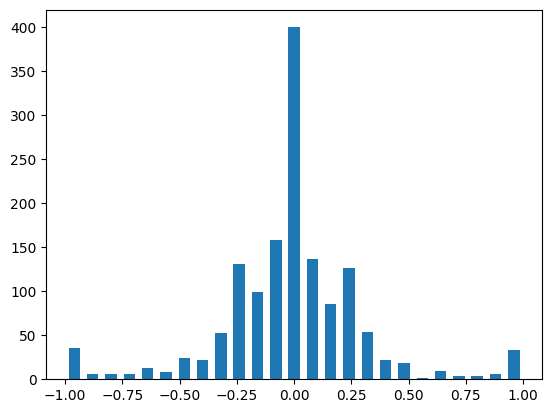

In [ ]:
num_bins=25
threshold=400
hist, bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
# plt.plot((np.min(data['steering']),np.max(data['steering'])),(threshold,threshold))

In [ ]:
data.shape

(1463, 7)

In [ ]:
def load_img_steering(datadir,df):
  image_path=[]
  steering=[]
  for i in range(len(data)):
    indexed_data=data.iloc[i]
    center,left,right=indexed_data[0],indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,'IMG',center.strip()))
    steering.append(float(indexed_data[3]))
    image_path.append(os.path.join(datadir,'IMG',left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    image_path.append(os.path.join(datadir,'IMG',right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths=np.asarray(image_path)
  steerings=np.asarray(steering)
  return image_paths,steerings

In [ ]:
image_paths, steerings=load_img_steering(datadir,data)

In [ ]:
image_paths

In [ ]:
len(image_paths)

In [ ]:
len(steerings)

In [ ]:
X_train, X_valid, y_train, y_valid=train_test_split(image_paths,steerings,test_size=0.2,random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train),len(X_valid)))

In [ ]:
fig, axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_train,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid,bins=num_bins,width=0.05,color='red')
axes[1].set_title('Validation set')

In [ ]:
def zoom(image):
  zoom=iaa.Affine(scale=(1,1.3))
  image=zoom.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)
fig, axes=plt.subplots(1,2,figsize=(10,4))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(zoomed_image)
axes[1].set_title('Zoomed Image')

In [ ]:
def pan(image):
  pan=iaa.Affine(translate_percent={'x':(-0.1,0.1),'y':(-0.1,0.1)})
  image=pan.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
panned_image=pan(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(panned_image)
axes[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness Changed Image')

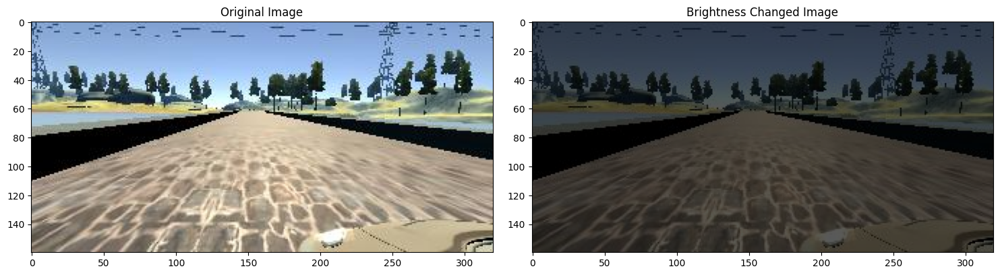

In [ ]:
def img_random_brightness(image):
  brightness=iaa.Multiply((0.2,1.2))
  image=brightness.augment_image(image)
  return image

image=image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
brightness_changed_image=img_random_brightness(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(brightness_changed_image)
axes[1].set_title('Brightness Changed Image')

Text(0.5, 1.0, 'Flipped Image')

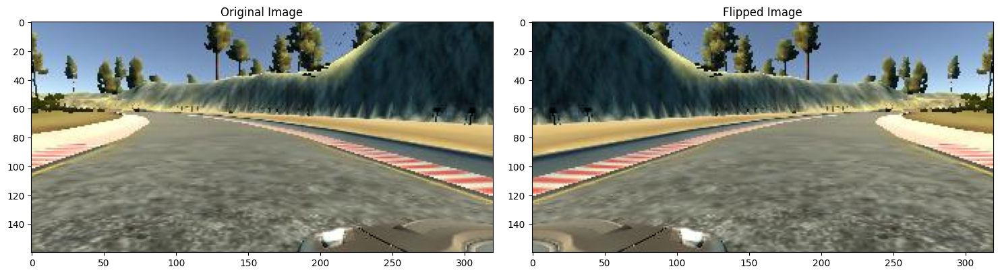

In [ ]:
def image_random_flip(image, steering_angle):
  image=cv2.flip(image,1)
  steering_angle=-steering_angle
  return image, steering_angle

random_index=random.randint(0,1000)
image=image_paths[random_index]
steering_angle=steerings[random_index]

original_image=mpimg.imread(image)
flipped_image,flipped_steering_angle=image_random_flip(original_image,steering_angle)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(flipped_image)
axes[1].set_title('Flipped Image')

In [ ]:
def random_augment(image,steering_angle):
  image=mpimg.imread(image)
  if np.random.rand()<0.5:
    image=pan(image)
  if np.random.rand()<0.5:
    image=zoom(image)
  if np.random.rand()<0.5:
    image=img_random_brightness(image)
  if np.random.rand()<0.5:
    image,steering_angle=image_random_flip(image,steering_angle)
  return image,steering_angle

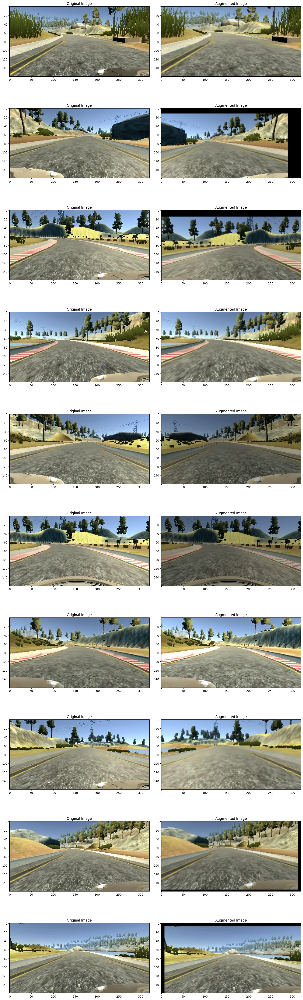

In [ ]:
ncol=2
nrow=10
fig,axes=plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
  randnum=random.randint(0,len(image_paths)-1)
  random_image=image_paths[randnum]
  random_steering=steerings[randnum]

  original_image=mpimg.imread(random_image)
  augmented_image,steering=random_augment(random_image,random_steering)

  axes[i][0].imshow(original_image)
  axes[i][0].set_title('Original Image')
  axes[i][1].imshow(augmented_image)
  axes[i][1].set_title('Augmented Image')

In [ ]:
def img_preprocessing(img):
  img=img[60:135,:,:]
  img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
  img=cv2.GaussianBlur(img,(3,3),0)
  img=cv2.resize(img,(200,66))
  img=img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

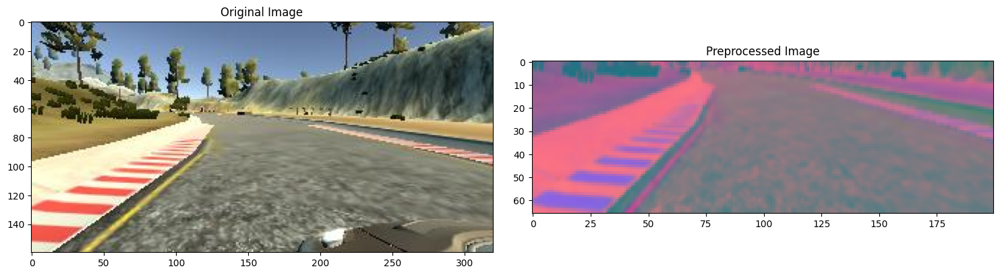

In [ ]:
image=image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocessing(original_image)

fig,axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi

Mon Nov  4 13:58:27 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
def batch_generator(image_paths,steering_ang,batch_size,is_training):
  while True:
    batch_img=[]
    batch_steering=[]
    for i in range(batch_size):
      random_index=random.randint(0,len(image_paths)-1)
      if is_training==True:
        im,steering=random_augment(image_paths[random_index],steering_ang[random_index])
      else:
        im=mpimg.imread(image_paths[random_index])
        steering=steering_ang[random_index]
      im=img_preprocessing(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img),np.asarray(batch_steering))

In [ ]:
X_train_gen, y_train_gen=next(batch_generator(X_train,y_train,1,1))
X_valid_gen, y_valid_gen=next(batch_generator(X_valid,y_valid,1,0))

Text(0.5, 1.0, 'Validation Image')

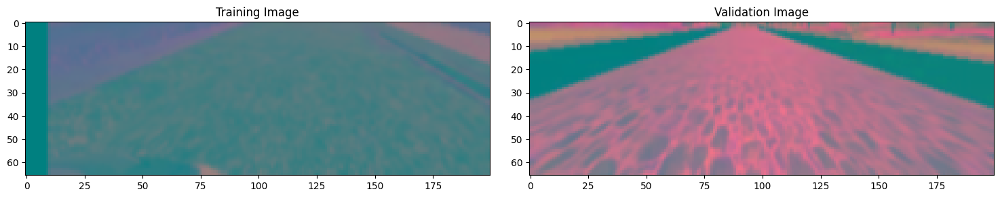

In [ ]:
fig, axes=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axes[0].imshow(X_train_gen[0])
axes[0].set_title('Training Image')
axes[1].imshow(X_valid_gen[0])
axes[1].set_title('Validation Image')

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, PReLU, TimeDistributed, LSTM
def Nvidia_model():
  model=Sequential()
  model.add(Conv2D(24,(5,5),strides=(2,2),input_shape=(66,200,3)))
  # model.add(PReLU())
  model.add(Conv2D(36,(5,5),strides=(2,2)))
  model.add(PReLU())
  model.add(Conv2D(48,(5,5),strides=(2,2)))
  model.add(PReLU())
  model.add(Conv2D(64,(5,5),strides=(2,2)))
  model.add(PReLU())

  model.add(Flatten())
  model.add(Dense(100))
  model.add(PReLU())
  model.add(Dense(50))
  model.add(PReLU())
  model.add(Dense(10))
  model.add(PReLU())
  model.add(Dense(1))

  optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse',optimizer=optimizer)
  return model

model=Nvidia_model()
print(model.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu (PReLU)                      │ (None, 14, 47, 36)          │          23,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu_1 (PReLU)                    │ (None, 5, 22, 48)           │           5,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 1, 9, 64)            │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu_2 (PReLU)                    │ (None, 1, 9, 64)            │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 576)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │          57,700 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu_3 (PReLU)                    │ (None, 100)                 │             100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu_4 (PReLU)                    │ (None, 50)                  │              50 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ p_re_lu_5 (PReLU)                    │ (None, 10)                  │              10 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 236,547 (924.01 KB)

 Trainable params: 236,547 (924.01 KB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
history=model.fit(batch_generator(X_train,y_train,100,1),
                  steps_per_epoch=300,
                  epochs=10,
                  validation_data=batch_generator(X_valid,y_valid,100,0),
                  validation_steps=200,
                  verbose=1,
                  shuffle=1)

In [ ]:
# def cnn_lstm_model(input_shape, num_classes):
#     model = Sequential()
#     model.add(TimeDistributed(Conv2D(24, (5, 5), activation='elu', input_shape=input_shape)))
#     model.add(TimeDistributed(Conv2D(36, (5, 5), activation='elu')))
#     model.add(TimeDistributed(Conv2D(48,(5,5)), activation='elu'))
#     model.add(TimeDistributed(Conv2D(64, (5, 5), activation='elu')))
#     model.add(TimeDistributed(Dropout(0.5)))
#     model.add(TimeDistributed(MaxPooling2D(pool_size=(2, 2))))
#     model.add(TimeDistributed(Flatten()))
#     model.add(LSTM(256, return_sequences=False))
#     model.add(LSTM(128))
#     model.add(Dense(128, activation='elu'))
#     model.add(Dense(num_classes, activation='softmax'))

#     model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])
#     return model

In [ ]:
# history=model.fit(batch_generator(X_train,y_train,100,1),
#                   steps_per_epoch=300,
#                   epochs=10,
#                   validation_data=batch_generator(X_valid,y_valid,100,0),
#                   validation_steps=200,
#                   verbose=1,
#                   shuffle=1)

In [ ]:
y_pred=model.predict(X_valid_gen)
mse=mean_squared_error(y_valid_gen,y_pred)
mae=mean_absolute_error(y_valid_gen,y_pred)
r2=r2_score(y_valid_gen,y_pred)
print('MSE:',mse)
print('MAE:',mae)
print('R2:',r2)

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training','Validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')